In [1]:
#!pip install geopandas

In [2]:
!pip install plotly

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [3]:
!pip install sidetable

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [4]:
import os
import json
from google.colab import drive
import pandas as pd
import numpy as np
import sidetable
from wordcloud import WordCloud, STOPWORDS
import matplotlib.pyplot as plt
import folium
from folium.plugins import HeatMap
import re
from nltk import tokenize
from nltk.tokenize import RegexpTokenizer, sent_tokenize, word_tokenize
from nltk.probability import FreqDist
import datetime
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.cluster import DBSCAN
from spacy.lang.en.stop_words import STOP_WORDS as stopwords
import spacy
import plotly.express as px
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import accuracy_score, classification_report
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.svm import LinearSVC
import warnings

In [5]:
drive.mount('/content/drive')
%cd '/content/drive/My Drive/Data Science/YachayAI/'

Mounted at /content/drive
/content/drive/My Drive/Data Science/YachayAI


In [6]:
text = pd.read_csv('Main_Dataset.csv')

#text.head()

In [7]:
#text.info()

In [8]:
text.shape

(604206, 5)

In [9]:
coordinates = pd.read_csv('Clusters_Coordinates.csv')

#coordinates.head()

In [10]:
coordinates.shape

(850, 3)

In [11]:
#coordinates.nunique()

In [12]:

# create a map object with initial coordinates
m = folium.Map(location=[coordinates['lat'].mean(), coordinates['lng'].mean()], zoom_start=12)

# add markers to the map
for i, row in coordinates.iterrows():
    folium.Marker([row['lat'], row['lng']]).add_to(m)


In [13]:
# Merge a target dataset with a dataset with subtitles
#data = pd.merge(text, coordinates, on="cluster_id", how='left')
#data.to_csv('dataset_with_coordinates.csv', index=False)


In [14]:
df = pd.read_csv('dataset_with_coordinates.csv')

In [15]:
df.head()

,id,text,user_id,timestamp,cluster_id,lat,lng
0,0,wow didn’t know the homies were coming through...,5.853807e+07,2021-08-02 01:25:46,2,34.020789,-118.411907
1,1,the foggy nights in la be peaceful such a calm...,1.032647e+18,2021-08-28 08:47:36,2,34.020789,-118.411907
2,2,khamisvideobomb,2.781174e+07,2021-08-13 15:49:15,2,34.020789,-118.411907
3,3,anyone tryna hit the gym 4 hmu,5.490040e+08,2021-08-31 22:41:20,2,34.020789,-118.411907
4,4,are you kidding me this intro is crazy.,2.963951e+07,2021-08-06 03:44:29,2,34.020789,-118.411907


In [16]:
df.shape

(604206, 7)

In [17]:
'''
# download state borders
usa = gpd.read_file('tl_2017_us_state/tl_2017_us_state.shp')

# create a function that determines whether the coordinates belong to the state
def get_state(lat, lng):
    point = Point(lng, lat)
    for idx, row in usa.iterrows():
        if row.geometry.contains(point):
            return row['STUSPS']
    return 'Unknown'

data['state'] = data.apply(lambda row: get_state(row['lat'], row['lng']), axis=1)

data.to_csv('Dataset_with_state.csv', index=False)
data
'''

"\n# download state borders\nusa = gpd.read_file('tl_2017_us_state/tl_2017_us_state.shp')\n\n# create a function that determines whether the coordinates belong to the state\ndef get_state(lat, lng):\n    point = Point(lng, lat)\n    for idx, row in usa.iterrows():\n        if row.geometry.contains(point):\n            return row['STUSPS']\n    return 'Unknown'\n\ndata['state'] = data.apply(lambda row: get_state(row['lat'], row['lng']), axis=1)\n\ndata.to_csv('Dataset_with_state.csv', index=False)\ndata\n"

In [18]:
# create a new column with the language of each row

#data['language'] = data['text'].apply(lambda x: langid.classify(x)[0])
#data.head(15)

In [19]:
#data.to_csv('Dataset_with_state_language.csv', index=False)


In [20]:
#data_language = pd.read_csv('Dataset_with_state_language.csv')
#data_location = pd.read_csv('dataset_with_location.csv')

In [21]:
# Merge a target dataset with a dataset with subtitles
#data = pd.merge(data_language, data_location[['id', 'country','city']], on="id", how='left')
#data.to_csv('dataset.csv', index=False)


In [22]:
df = pd.read_csv('dataset_with_coordinates.csv')

In [23]:
df.head(10)

,id,text,user_id,timestamp,cluster_id,lat,lng
0,0,wow didn’t know the homies were coming through...,5.853807e+07,2021-08-02 01:25:46,2,34.020789,-118.411907
1,1,the foggy nights in la be peaceful such a calm...,1.032647e+18,2021-08-28 08:47:36,2,34.020789,-118.411907
2,2,khamisvideobomb,2.781174e+07,2021-08-13 15:49:15,2,34.020789,-118.411907
3,3,anyone tryna hit the gym 4 hmu,5.490040e+08,2021-08-31 22:41:20,2,34.020789,-118.411907
4,4,are you kidding me this intro is crazy.,2.963951e+07,2021-08-06 03:44:29,2,34.020789,-118.411907
5,5,grins in vascular surgery thinking about our h...,8.274070e+17,2021-08-16 15:34:11,2,34.020789,-118.411907
6,6,i demand tiki drinks and a suicide squad viewi...,7.912923e+07,2021-08-06 01:42:32,2,34.020789,-118.411907
7,7,it’s weirdo shit to me that you’d want someone...,7.085044e+17,2021-08-23 23:16:20,2,34.020789,-118.411907
8,8,you are right. we have not have time to compil...,1.374813e+18,2021-08-13 18:59:31,2,34.020789,-118.411907
9,9,hail to the liars,9.305705e+08,2021-02-28 10:54:41,2,34.020789,-118.411907


In [24]:

# calculate the number and percentage of missing values
missing = pd.DataFrame({"Columns":df.columns})
missing.set_index("Columns")
missing["Number of missing values"] = df.isna().sum().values
missing["Percent of missing values"] = round(df.isna().sum()*100/len(df),2).values
missing


,Columns,Number of missing values,Percent of missing values
0,id,0,0.00
1,text,0,0.00
2,user_id,0,0.00
3,timestamp,12794,2.12
4,cluster_id,0,0.00
5,lat,0,0.00
6,lng,0,0.00


In [25]:
# remove rows containing NaN values
df = df.dropna()

In [26]:
# convert 'timestamp' column to datetime format
df['timestamp'] = pd.to_datetime(df['timestamp'])

# add columns with year, month, day, day of week, time and time of day
df['year'] = df['timestamp'].dt.year
df['month'] = df['timestamp'].dt.month
df['day'] = df['timestamp'].dt.day
df['day_of_week'] = df['timestamp'].dt.dayofweek
df['time'] = df['timestamp'].dt.time
df['time_of_the_day'] = pd.cut(df['timestamp'].dt.hour, bins=[0, 6, 12, 18, 24], include_lowest=True, labels=['night', 'morning', 'afternoon', 'evening'])

# remove original timestamp column
#df.drop(columns=['timestamp'], inplace=True)

In [27]:
df.shape

(591412, 13)

## Exploratory Data Analysis

In [28]:
# count the number of NaN values in each column
df.isna().sum()

id                 0
text               0
user_id            0
timestamp          0
cluster_id         0
lat                0
lng                0
year               0
month              0
day                0
day_of_week        0
time               0
time_of_the_day    0
dtype: int64

### Date and Time

In [29]:
# replace float values with int
df.loc[:, ['year', 'month', 'day', 'day_of_week']] = df.loc[:, ['year', 'month', 'day', 'day_of_week']].astype(int)

In [30]:
#  Dictionary of days of the week
days_dict = {0: 'Monday', 1: 'Tuesday', 2: 'Wednesday', 3: 'Thursday', 4: 'Friday', 5: 'Saturday', 6: 'Sunday'}

# function to convert day of the week numbers
def get_weekday(day):
    return days_dict[day]

df['weekday'] = df['day_of_week'].apply(get_weekday)

In [31]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 591412 entries, 0 to 604205
Data columns (total 14 columns):
 #   Column           Non-Null Count   Dtype         
---  ------           --------------   -----         
 0   id               591412 non-null  int64         
 1   text             591412 non-null  object        
 2   user_id          591412 non-null  float64       
 3   timestamp        591412 non-null  datetime64[ns]
 4   cluster_id       591412 non-null  int64         
 5   lat              591412 non-null  float64       
 6   lng              591412 non-null  float64       
 7   year             591412 non-null  int64         
 8   month            591412 non-null  int64         
 9   day              591412 non-null  int64         
 10  day_of_week      591412 non-null  int64         
 11  time             591412 non-null  object        
 12  time_of_the_day  591412 non-null  category      
 13  weekday          591412 non-null  object        
dtypes: category(1), date

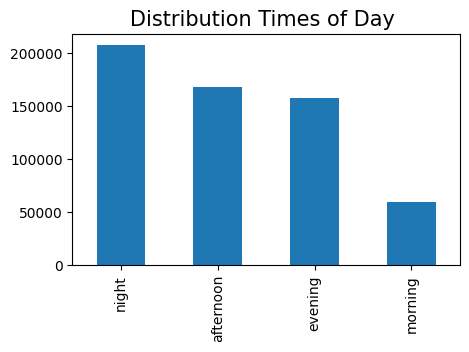

In [32]:
df['time_of_the_day'].value_counts().plot.bar(figsize=(5, 3))
plt.title("Distribution Times of Day ", size=15)
plt.show()

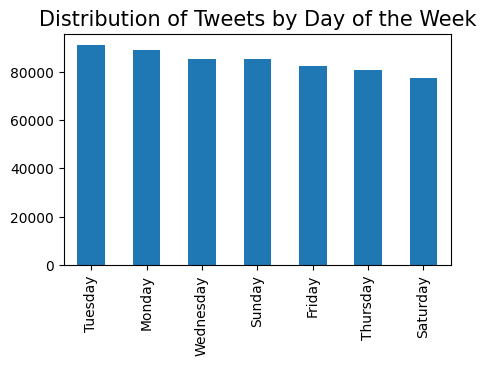

In [33]:
df['weekday'].value_counts().plot.bar(figsize=(5, 3))
plt.title("Distribution of Tweets by Day of the Week", size=15)
plt.show()

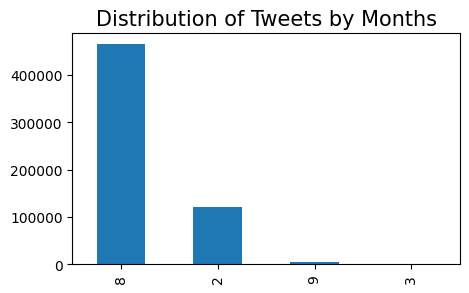

In [34]:
df['month'].value_counts().plot.bar(figsize=(5, 3))
plt.title("Distribution of Tweets by Months", size=15)
plt.show()

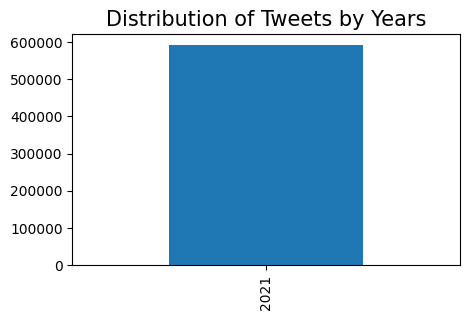

In [35]:
df['year'].value_counts().plot.bar(figsize=(5, 3))
plt.title("Distribution of Tweets by Years", size=15)
plt.show()

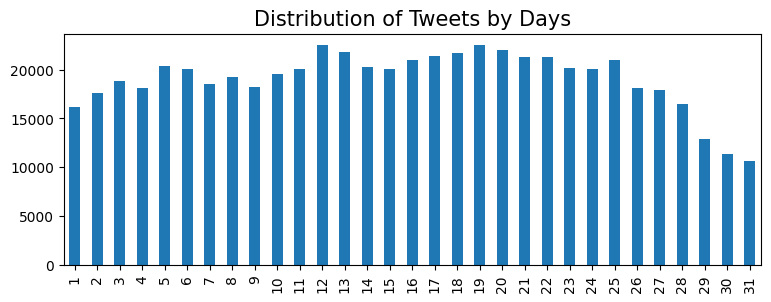

In [36]:
df['day'].value_counts().sort_index().plot.bar(figsize=(9, 3))
plt.title("Distribution of Tweets by Days", size=15)
plt.show()

In [37]:
df.head()

,id,text,user_id,timestamp,cluster_id,lat,lng,year,month,day,day_of_week,time,time_of_the_day,weekday
0,0,wow didn’t know the homies were coming through...,5.853807e+07,2021-08-02 01:25:46,2,34.020789,-118.411907,2021,8,2,0,01:25:46,night,Monday
1,1,the foggy nights in la be peaceful such a calm...,1.032647e+18,2021-08-28 08:47:36,2,34.020789,-118.411907,2021,8,28,5,08:47:36,morning,Saturday
2,2,khamisvideobomb,2.781174e+07,2021-08-13 15:49:15,2,34.020789,-118.411907,2021,8,13,4,15:49:15,afternoon,Friday
3,3,anyone tryna hit the gym 4 hmu,5.490040e+08,2021-08-31 22:41:20,2,34.020789,-118.411907,2021,8,31,1,22:41:20,evening,Tuesday
4,4,are you kidding me this intro is crazy.,2.963951e+07,2021-08-06 03:44:29,2,34.020789,-118.411907,2021,8,6,4,03:44:29,night,Friday


In [38]:
df.to_csv('dataset_day_time.csv', index=False)

### Location

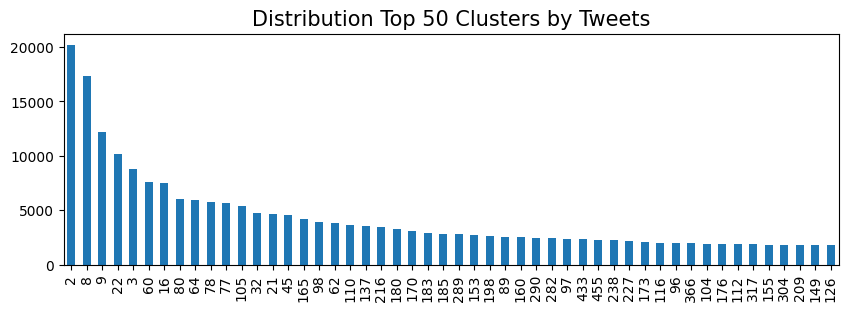

In [39]:
df['cluster_id'].value_counts().head(50).sort_values(ascending = False).plot.bar(figsize=(10,3 ))
plt.title("Distribution Top 50 Clusters by Tweets", size=15)
plt.show()

In [40]:
#data_state = pd.read_csv('Dataset_with_state.csv')
#data_time = pd.read_csv('dataset_day_time.csv')


In [41]:
#data = pd.merge(data_time, data_state[['id', 'state']], on="id", how='left')
#data.to_csv('dataset_state_time.csv', index=False)

In [42]:
df = pd.read_csv('dataset_state_time.csv')
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 591412 entries, 0 to 591411
Data columns (total 15 columns):
 #   Column           Non-Null Count   Dtype  
---  ------           --------------   -----  
 0   id               591412 non-null  int64  
 1   text             591412 non-null  object 
 2   user_id          591412 non-null  float64
 3   timestamp        591412 non-null  object 
 4   cluster_id       591412 non-null  int64  
 5   lat              591412 non-null  float64
 6   lng              591412 non-null  float64
 7   year             591412 non-null  int64  
 8   month            591412 non-null  int64  
 9   day              591412 non-null  int64  
 10  day_of_week      591412 non-null  int64  
 11  time             591412 non-null  object 
 12  time_of_the_day  591412 non-null  object 
 13  weekday          591412 non-null  object 
 14  state            591412 non-null  object 
dtypes: float64(3), int64(6), object(6)
memory usage: 67.7+ MB


In [43]:
df['state'].nunique()

52

In [44]:
df['state'].unique()

array(['CA', 'TX', 'NY', 'PA', 'GA', 'Unknown', 'IL', 'LA', 'VA', 'NC',
       'SC', 'WA', 'AL', 'OH', 'WI', 'DC', 'TN', 'FL', 'NV', 'IN', 'KY',
       'OR', 'MD', 'CO', 'MA', 'DE', 'HI', 'AZ', 'OK', 'MN', 'MI', 'MS',
       'AR', 'MO', 'KS', 'UT', 'NJ', 'NM', 'CT', 'WV', 'RI', 'IA', 'PR',
       'MT', 'NE', 'ME', 'SD', 'ID', 'VT', 'AK', 'ND', 'NH'], dtype=object)

In [45]:

# Creating a map
m = folium.Map(location=[df['lat'].mean(), df['lng'].mean()], zoom_start=10)

# Creating a heat map layer based on coordinates
heat_data = [[row['lat'],row['lng']] for index, row in df.iterrows()]
HeatMap(heat_data).add_to(m)


In [46]:
# display the map
m

In [47]:
# Group the Members Referred by country
data_state = df.groupby(["state"]).agg({"id": "count"}).reset_index()

In [48]:

# Draw a heat map of the Members Referred by US state
print('The distribution of states by the number of members on the map.')
fig = px.choropleth(data_state,
                    locations='state',
                    locationmode="USA-states",
                    scope="usa",
                    color='id',
                    color_continuous_scale="mint",

                    )
fig.show()


The distribution of states by the number of members on the map.


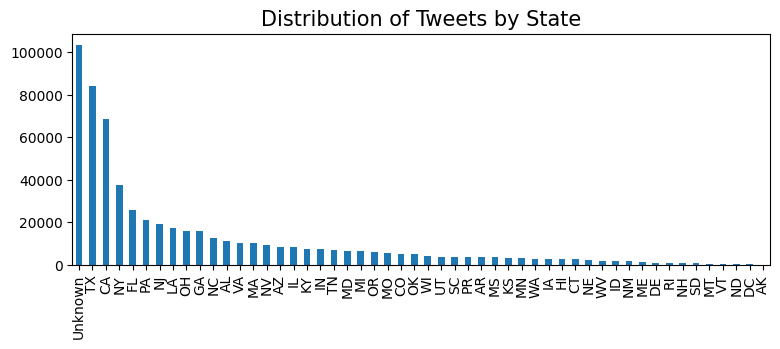

In [49]:
df['state'].value_counts().sort_values(ascending = False).plot.bar(figsize=(9, 3))
plt.title("Distribution of Tweets by State", size=15)
plt.show()

In [50]:
#data_location = pd.read_csv('dataset_with_location.csv')
#data_time = pd.read_csv('dataset_day_time.csv')

In [51]:
#data = pd.merge(data_time, data_location[['id', 'country','city']], on="id", how='left')
#data.to_csv('dataset_location_time.csv', index=False)

In [52]:
df = pd.read_csv('dataset_location_time.csv')
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 591412 entries, 0 to 591411
Data columns (total 16 columns):
 #   Column           Non-Null Count   Dtype  
---  ------           --------------   -----  
 0   id               591412 non-null  int64  
 1   text             591412 non-null  object 
 2   user_id          591412 non-null  float64
 3   timestamp        591412 non-null  object 
 4   cluster_id       591412 non-null  int64  
 5   lat              591412 non-null  float64
 6   lng              591412 non-null  float64
 7   year             591412 non-null  int64  
 8   month            591412 non-null  int64  
 9   day              591412 non-null  int64  
 10  day_of_week      591412 non-null  int64  
 11  time             591412 non-null  object 
 12  time_of_the_day  591412 non-null  object 
 13  weekday          591412 non-null  object 
 14  country          563341 non-null  object 
 15  city             534333 non-null  object 
dtypes: float64(3), int64(6), object(7)
mem

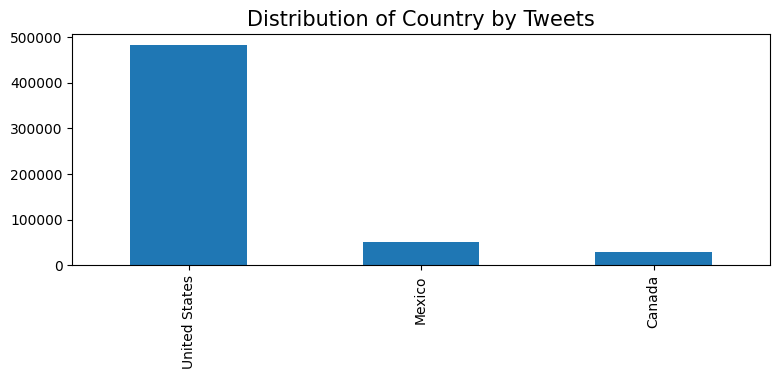

In [53]:
df['country'].value_counts().sort_values(ascending = False).plot.bar(figsize=(9, 3))
plt.title("Distribution of Country by Tweets", size=15)
plt.show()

In [54]:
df['city'].nunique()

390

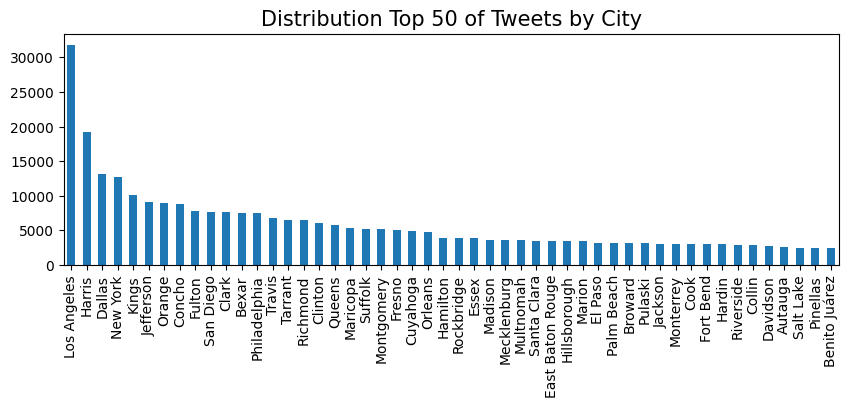

In [55]:
df['city'].value_counts().head(50).sort_values(ascending = False).plot.bar(figsize=(10,3 ))
plt.title("Distribution Top 50 of Tweets by City", size=15)
plt.show()

### Language

In [56]:
#data_location = pd.read_csv('dataset_location_time.csv')
#data_language = pd.read_csv('Dataset_with_state_language.csv')

In [57]:
#data = pd.merge(data_location, data_language[['id', 'language']], on="id", how='left')
#data.to_csv('dataset_location_time_language.csv', index=False)

In [58]:
df = pd.read_csv('dataset_location_time_language.csv')
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 591412 entries, 0 to 591411
Data columns (total 17 columns):
 #   Column           Non-Null Count   Dtype  
---  ------           --------------   -----  
 0   id               591412 non-null  int64  
 1   text             591412 non-null  object 
 2   user_id          591412 non-null  float64
 3   timestamp        591412 non-null  object 
 4   cluster_id       591412 non-null  int64  
 5   lat              591412 non-null  float64
 6   lng              591412 non-null  float64
 7   year             591412 non-null  int64  
 8   month            591412 non-null  int64  
 9   day              591412 non-null  int64  
 10  day_of_week      591412 non-null  int64  
 11  time             591412 non-null  object 
 12  time_of_the_day  591412 non-null  object 
 13  weekday          591412 non-null  object 
 14  country          563341 non-null  object 
 15  city             534333 non-null  object 
 16  language         591412 non-null  obje

In [59]:
df['num_characters'] = df['text'].apply(lambda x: len(str(x)))

In [60]:
df.head()



,id,text,user_id,timestamp,cluster_id,lat,lng,year,month,day,day_of_week,time,time_of_the_day,weekday,country,city,language,num_characters
0,0,wow didn’t know the homies were coming through...,5.853807e+07,2021-08-02 01:25:46,2,34.020789,-118.411907,2021,8,2,0,01:25:46,night,Monday,United States,Los Angeles,en,55
1,1,the foggy nights in la be peaceful such a calm...,1.032647e+18,2021-08-28 08:47:36,2,34.020789,-118.411907,2021,8,28,5,08:47:36,morning,Saturday,United States,Los Angeles,en,60
2,2,khamisvideobomb,2.781174e+07,2021-08-13 15:49:15,2,34.020789,-118.411907,2021,8,13,4,15:49:15,afternoon,Friday,United States,Los Angeles,xh,15
3,3,anyone tryna hit the gym 4 hmu,5.490040e+08,2021-08-31 22:41:20,2,34.020789,-118.411907,2021,8,31,1,22:41:20,evening,Tuesday,United States,Los Angeles,en,30
4,4,are you kidding me this intro is crazy.,2.963951e+07,2021-08-06 03:44:29,2,34.020789,-118.411907,2021,8,6,4,03:44:29,night,Friday,United States,Los Angeles,en,39


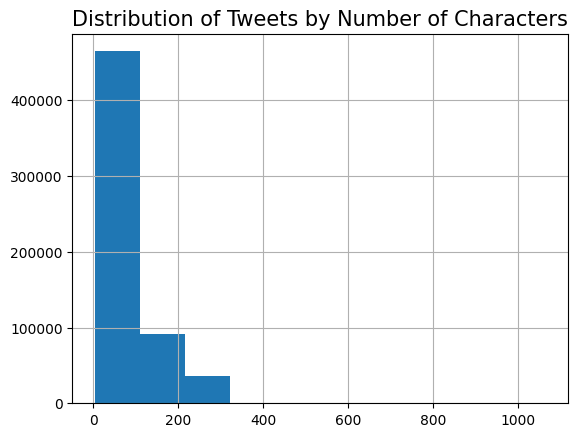

In [61]:
df['num_characters'].hist()
plt.title("Distribution of Tweets by Number of Characters", size=15)
plt.show()

In [62]:
len(df[df['num_characters'] > 350])

17

In [63]:
max(df['num_characters'])

1065

In [64]:
characters = df[df['num_characters'] < 350]

In [65]:
count_not_en = (df['language'] != 'en').sum()

count_not_en

123224

In [66]:
# the percentage of non-English to the total number
count_not_en/len(df['language']) * 100

20.83555964370016

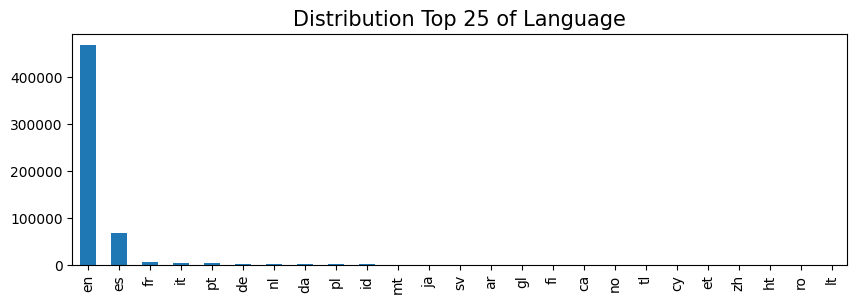

In [67]:

df['language'].value_counts().head(25).sort_values(ascending = False).plot.bar(figsize=(10,3 ))
plt.title("Distribution Top 25 of Language", size=15)
plt.show()


In [68]:

# calculate the number and percentage of language values
percentages = df.stb.freq(['language'], style=True)
percentages


,language,count,percent,cumulative_count,cumulative_percent
0,en,"468,188",79.16%,"468,188",79.16%
1,es,"68,845",11.64%,"537,033",90.81%
2,fr,"7,038",1.19%,"544,071",92.00%
3,it,"4,478",0.76%,"548,549",92.75%
4,pt,"4,230",0.72%,"552,779",93.47%
5,de,"3,544",0.60%,"556,323",94.07%
6,nl,"2,479",0.42%,"558,802",94.49%
7,da,"2,263",0.38%,"561,065",94.87%
8,pl,"1,937",0.33%,"563,002",95.20%
9,id,"1,835",0.31%,"564,837",95.51%


In [69]:
df[df['language'] == 'es']['text'].head(15)

40                                        makes no sense
41     este man si tiene ganas de triunfar aquí esta ...
101    el día de los inocentes es el 20 diciembre. se...
128                              lmaooooo let me fix urs
131                acuérdate donde estabas cuando tembló
296                                         night babies
351    me importa un carajo jajaja viva el américa we...
366    william es sin duda el diputado que le dice a ...
440    lmfaooo i’m fucken dead ojalá que esté bien si...
455                                        gracias craig
464    quien va a hablar mal de su casa. . . aunque s...
474    fuertes acusaciones vinculan a ninel conde en ...
513         gran trabajo gus tremenda tercia con y jorge
521    y si le digo q esa foto en blanco negro es dem...
533    te miras como el hijo del tacuasin ja jajajaja...
Name: text, dtype: object

In [70]:
df[df['language'] == 'it']['text'].head(15)

314                                       no hahaha.
563                    no i'm definitely no outcast.
1017                                     killafornia
1020                 fupa more like fupamakinmehorny
1063                                      no fliters
1145    one day daddy might love you again...... not
1166              ryuichi sakamotot.cotdxsrarg1n via
1502        itsalwaysagoodideato great communication
1854               i be feeling like i can’t breathe
2062                 i can't believe dodgers got max
2294                      like hello girl we need it
2339                                          we did
2425              hol’up let’s get straight into it.
2493                                     it’s bagged
2544                                    calla basura
Name: text, dtype: object

In [71]:
df[df['language'] == 'fr']['text'].head(15)

39                                          strong colors
135                       jajajaja jodanse brutos jodanse
161                   newprofilepic americans let’s party
176                                       congrats sarina
395                                       water technique
448                                         quand la tête
482                                           purpleville
625                       na delta variant dey dance ohhh
627                              room tour champs edition
751     “mai oc ka mag office tomorrow” amen 70 min dr...
759                                            fire movie
773                                               quaint.
1095                                        rod wavecloud
2172                               one month plus one day
2265                                  bad. next question.
Name: text, dtype: object

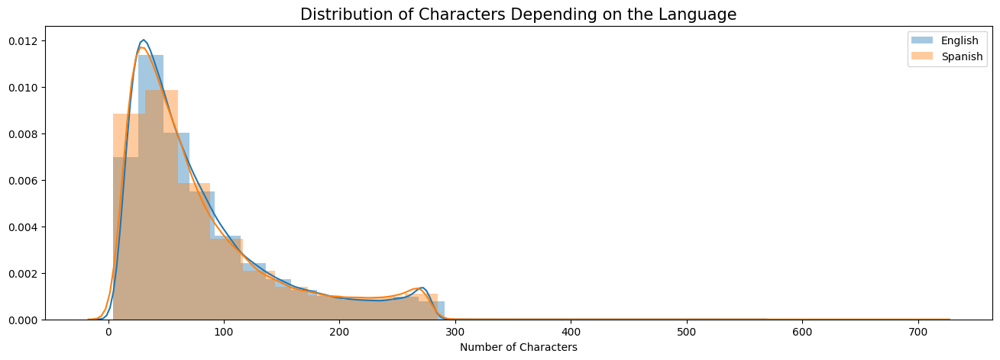

In [72]:
# Group Language by Number of Characters
warnings.simplefilter("ignore")
plt.figure(figsize=(16, 5))
sns.distplot(df[df['language']=='en']['num_characters'], label='English',  bins=25)
sns.distplot(df[df['language']=='es']['num_characters'], label='Spanish',  bins=25)
plt.legend()
plt.title("Distribution of Characters Depending on the Language", size=15)
plt.xlabel('Number of Characters')
plt.ylabel('')
plt.show()

In [73]:

def get_top_n_bigram(corpus, n=None):
    vec = CountVectorizer(ngram_range=(2, 2), stop_words='english').fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0) 
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq = sorted(words_freq, key = lambda x: x[1], reverse=True)
    return words_freq[:n]

In [74]:
def generate_basic_wordcloud(data):
    cloud = WordCloud(width=600,
                      height=480,
                      max_words=200,
                      colormap='tab20c',
                      stopwords= stopwords,
                      collocations=True).generate_from_text(data)
    plt.figure(figsize=(15,12))
    plt.imshow(cloud)
    plt.axis('off')
    plt.show()

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


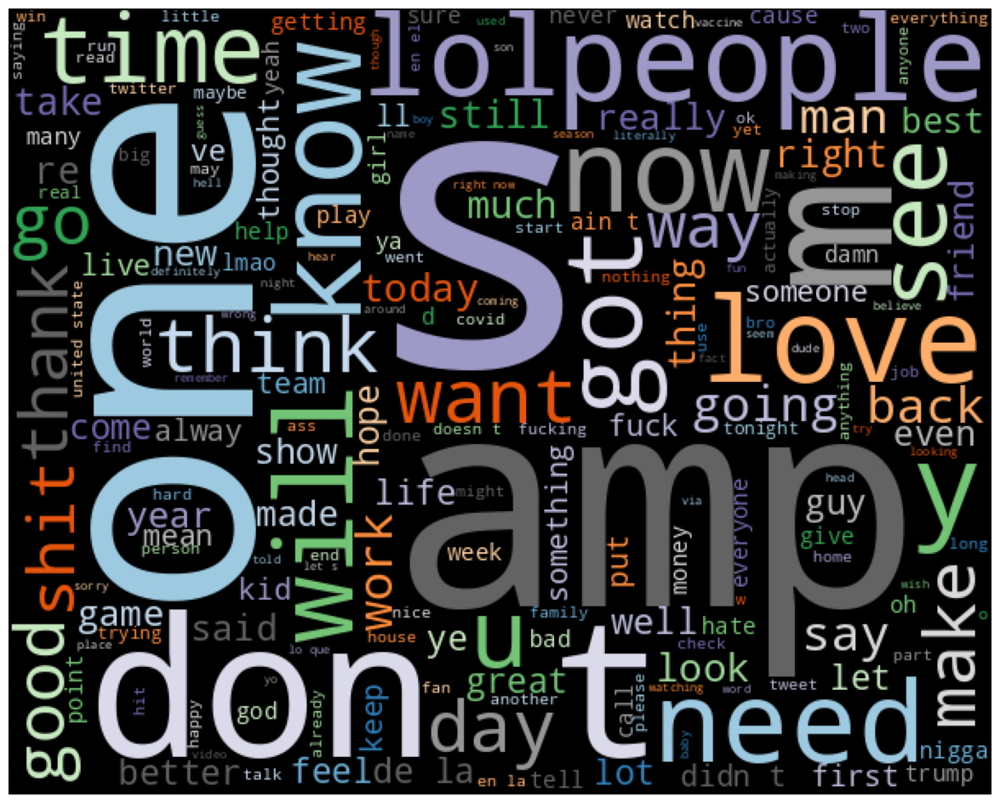

In [75]:

import nltk
nltk.download('punkt')

text = ' '.join(df['text'].tolist())
stopwords = set(STOPWORDS)

generate_basic_wordcloud(text)


In [76]:

# Splitting a string into tokens
tokens = word_tokenize(text)

# Calculate the frequency of each token
fdist = FreqDist(tokens)

# display the 20 most common tokens
fdist.most_common(20)


[('.', 353622),
 ('the', 231495),
 ('i', 217388),
 ('a', 171503),
 ('to', 170352),
 ('’', 163366),
 ('and', 126361),
 ('you', 102661),
 ('it', 98502),
 ('of', 94368),
 ('in', 93180),
 ('is', 89538),
 ('that', 79466),
 ('for', 71279),
 ('my', 67178),
 ('this', 66273),
 ('on', 62476),
 ('s', 55146),
 ('me', 54528),
 ('be', 46433)]

In [77]:
common_words = get_top_n_bigram(df['text'], 20)

df1 = pd.DataFrame(common_words, columns = ['tweet_text' , 'count'])

px.bar(df1.groupby('tweet_text').sum()['count'].sort_values(ascending=False).reset_index().head(20), x='tweet_text', y='count', title='Top 20 bigrams in All Tweets', labels={'tweet_text':'Tweet Text', 'count':'Count'})


In [78]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 591412 entries, 0 to 591411
Data columns (total 18 columns):
 #   Column           Non-Null Count   Dtype  
---  ------           --------------   -----  
 0   id               591412 non-null  int64  
 1   text             591412 non-null  object 
 2   user_id          591412 non-null  float64
 3   timestamp        591412 non-null  object 
 4   cluster_id       591412 non-null  int64  
 5   lat              591412 non-null  float64
 6   lng              591412 non-null  float64
 7   year             591412 non-null  int64  
 8   month            591412 non-null  int64  
 9   day              591412 non-null  int64  
 10  day_of_week      591412 non-null  int64  
 11  time             591412 non-null  object 
 12  time_of_the_day  591412 non-null  object 
 13  weekday          591412 non-null  object 
 14  country          563341 non-null  object 
 15  city             534333 non-null  object 
 16  language         591412 non-null  obje

In [79]:
# Create a dataset that contains English, Spanish, French, Italian.

languages  = ['en', 'es', 'fr', 'it']
language_df = df[df['language'].str.contains('|'.join(languages))]
#language_df.head()


In [80]:
language_df.shape

(548549, 18)

In [81]:
language_df.isnull().sum()

id                     0
text                   0
user_id                0
timestamp              0
cluster_id             0
lat                    0
lng                    0
year                   0
month                  0
day                    0
day_of_week            0
time                   0
time_of_the_day        0
weekday                0
country            24917
city               51076
language               0
num_characters         0
dtype: int64

In [82]:
# remove rows containing NaN values
language_df = language_df.dropna()

In [83]:
language_df.shape

(497473, 18)

In [84]:


common_words = get_top_n_bigram(language_df['text'], 20)

df1 = pd.DataFrame(common_words, columns = ['tweet_text' , 'count'])

px.bar(df1.groupby('tweet_text').sum()['count'].sort_values(ascending=False).reset_index().head(20), x='tweet_text', y='count', title='Top 20 bigrams in Tweets with 4 languages', labels={'tweet_text':'Tweet Text', 'count':'Count'})


In [85]:
language_df['language'].nunique()

4

In [86]:
# Creating a map
m = folium.Map(location=[language_df['lat'].mean(), language_df['lng'].mean()], zoom_start=10)

# Creating a heat map layer based on coordinates
heat_data = [[row['lat'],row['lng']] for index, row in language_df.iterrows()]
HeatMap(heat_data).add_to(m)


In [87]:
#m

In [88]:
language_df.to_csv('dataset_with_city.csv', index=False)

In [89]:
df.head()

,id,text,user_id,timestamp,cluster_id,lat,lng,year,month,day,day_of_week,time,time_of_the_day,weekday,country,city,language,num_characters
0,0,wow didn’t know the homies were coming through...,5.853807e+07,2021-08-02 01:25:46,2,34.020789,-118.411907,2021,8,2,0,01:25:46,night,Monday,United States,Los Angeles,en,55
1,1,the foggy nights in la be peaceful such a calm...,1.032647e+18,2021-08-28 08:47:36,2,34.020789,-118.411907,2021,8,28,5,08:47:36,morning,Saturday,United States,Los Angeles,en,60
2,2,khamisvideobomb,2.781174e+07,2021-08-13 15:49:15,2,34.020789,-118.411907,2021,8,13,4,15:49:15,afternoon,Friday,United States,Los Angeles,xh,15
3,3,anyone tryna hit the gym 4 hmu,5.490040e+08,2021-08-31 22:41:20,2,34.020789,-118.411907,2021,8,31,1,22:41:20,evening,Tuesday,United States,Los Angeles,en,30
4,4,are you kidding me this intro is crazy.,2.963951e+07,2021-08-06 03:44:29,2,34.020789,-118.411907,2021,8,6,4,03:44:29,night,Friday,United States,Los Angeles,en,39


In [90]:
df.shape

(591412, 18)

In [91]:
df.drop(columns = ['timestamp', 'lat', 'lng', 'id', 'country','city','year'],axis = 1, inplace=True)

In [92]:
df.shape

(591412, 11)

In [93]:
df.head()

,text,user_id,cluster_id,month,day,day_of_week,time,time_of_the_day,weekday,language,num_characters
0,wow didn’t know the homies were coming through...,5.853807e+07,2,8,2,0,01:25:46,night,Monday,en,55
1,the foggy nights in la be peaceful such a calm...,1.032647e+18,2,8,28,5,08:47:36,morning,Saturday,en,60
2,khamisvideobomb,2.781174e+07,2,8,13,4,15:49:15,afternoon,Friday,xh,15
3,anyone tryna hit the gym 4 hmu,5.490040e+08,2,8,31,1,22:41:20,evening,Tuesday,en,30
4,are you kidding me this intro is crazy.,2.963951e+07,2,8,6,4,03:44:29,night,Friday,en,39


In [94]:
df.to_csv('dataset_EDA_no_city.csv', index=False)